MIDTERM - ESIN BILGIN 

TASK - 1: Read all the montly doctor data and sort doctors with different practices

In [0]:
dbutils.fs.ls("/FileStore/tables/")

Out[46]: [FileInfo(path='dbfs:/FileStore/tables/2024_11_23___DBFS_Example__1_.ipynb', name='2024_11_23___DBFS_Example__1_.ipynb', size=16825808, modificationTime=1732400438000),
 FileInfo(path='dbfs:/FileStore/tables/NPPES_Deactivated_NPI_Report_20241014-1.csv', name='NPPES_Deactivated_NPI_Report_20241014-1.csv', size=6655606, modificationTime=1732363706000),
 FileInfo(path='dbfs:/FileStore/tables/NPPES_Deactivated_NPI_Report_20241014.csv', name='NPPES_Deactivated_NPI_Report_20241014.csv', size=6655606, modificationTime=1732352278000),
 FileInfo(path='dbfs:/FileStore/tables/data.rar', name='data.rar', size=7344784, modificationTime=1732418394000),
 FileInfo(path='dbfs:/FileStore/tables/newdeactivated.csv', name='newdeactivated.csv', size=6706646, modificationTime=1732400328000),
 FileInfo(path='dbfs:/FileStore/tables/npidata_pfile_20050523_20241013_csv-1.gz', name='npidata_pfile_20050523_20241013_csv-1.gz', size=933913687, modificationTime=1732363856000),
 FileInfo(path='dbfs:/FileStor

In [0]:
from pyspark.sql import SparkSession
from pyspark.sql.functions import col, count

# Setting up the Spark session
spark = SparkSession.builder.appName("DoctorDataAnalysis").getOrCreate()

# Load the .gz file (compressed from the original dataset) with partitioning
doctor_data_spark = spark.read.option("header", "true") \
                              .csv("/FileStore/tables/npidata_pfile_20050523_20241013_csv.gz") \
                              .repartition(8)  # Partition the DataFrame into 8 parts

# Load the weekly data files and combine them with the main dataset
weekly_1 = spark.read.option("header", "true").csv("/FileStore/tables/weekly_1.csv")
weekly_2 = spark.read.option("header", "true").csv("/FileStore/tables/weekly_2.csv")
weekly_3 = spark.read.option("header", "true").csv("/FileStore/tables/weekly_3.csv")
weekly_4 = spark.read.option("header", "true").csv("/FileStore/tables/weekly_4.csv")

# Combine all weekly files into a single DataFrame using union
weekly_data_combined = weekly_1.union(weekly_2).union(weekly_3).union(weekly_4)

# Union the weekly data with the main dataset
combined_doctor_data = doctor_data_spark.union(weekly_data_combined)

# TASK-1: Display the combined dataset in a tabular form to see how it looks
display(combined_doctor_data)

# Count the total rows in the combined dataset
total_count_combined_data = combined_doctor_data.count()
print(f"Total NPI dataset rows after union with weekly data: {total_count_combined_data}")

# Grouping the doctors by "Healthcare Provider Taxonomy Code_1" to see the count of doctors in each practice area
# Assuming that the combined dataset contains a "Healthcare Provider Taxonomy Code_1" that represents the practice
grouped_by_practice = combined_doctor_data.groupBy("Healthcare Provider Taxonomy Code_1").agg(count("NPI").alias("count"))

# Sorting the practices by the number of doctors in descending order
grouped_by_practice_sorted = grouped_by_practice.orderBy(col("count").desc())

# Display the sorted results (This will display all practices with their counts)
display(grouped_by_practice_sorted)

NPI,Entity Type Code,Replacement NPI,Employer Identification Number (EIN),Provider Organization Name (Legal Business Name),Provider Last Name (Legal Name),Provider First Name,Provider Middle Name,Provider Name Prefix Text,Provider Name Suffix Text,Provider Credential Text,Provider Other Organization Name,Provider Other Organization Name Type Code,Provider Other Last Name,Provider Other First Name,Provider Other Middle Name,Provider Other Name Prefix Text,Provider Other Name Suffix Text,Provider Other Credential Text,Provider Other Last Name Type Code,Provider First Line Business Mailing Address,Provider Second Line Business Mailing Address,Provider Business Mailing Address City Name,Provider Business Mailing Address State Name,Provider Business Mailing Address Postal Code,Provider Business Mailing Address Country Code (If outside U.S.),Provider Business Mailing Address Telephone Number,Provider Business Mailing Address Fax Number,Provider First Line Business Practice Location Address,Provider Second Line Business Practice Location Address,Provider Business Practice Location Address City Name,Provider Business Practice Location Address State Name,Provider Business Practice Location Address Postal Code,Provider Business Practice Location Address Country Code (If outside U.S.),Provider Business Practice Location Address Telephone Number,Provider Business Practice Location Address Fax Number,Provider Enumeration Date,Last Update Date,NPI Deactivation Reason Code,NPI Deactivation Date,NPI Reactivation Date,Provider Gender Code,Authorized Official Last Name,Authorized Official First Name,Authorized Official Middle Name,Authorized Official Title or Position,Authorized Official Telephone Number,Healthcare Provider Taxonomy Code_1,Provider License Number_1,Provider License Number State Code_1,Healthcare Provider Primary Taxonomy Switch_1,Healthcare Provider Taxonomy Code_2,Provider License Number_2,Provider License Number State Code_2,Healthcare Provider Primary Taxonomy Switch_2,Healthcare Provider Taxonomy Code_3,Provider License Number_3,Provider License Number State Code_3,Healthcare Provider Primary Taxonomy Switch_3,Healthcare Provider Taxonomy Code_4,Provider License Number_4,Provider License Number State Code_4,Healthcare Provider Primary Taxonomy Switch_4,Healthcare Provider Taxonomy Code_5,Provider License Number_5,Provider License Number State Code_5,Healthcare Provider Primary Taxonomy Switch_5,Healthcare Provider Taxonomy Code_6,Provider License Number_6,Provider License Number State Code_6,Healthcare Provider Primary Taxonomy Switch_6,Healthcare Provider Taxonomy Code_7,Provider License Number_7,Provider License Number State Code_7,Healthcare Provider Primary Taxonomy Switch_7,Healthcare Provider Taxonomy Code_8,Provider License Number_8,Provider License Number State Code_8,Healthcare Provider Primary Taxonomy Switch_8,Healthcare Provider Taxonomy Code_9,Provider License Number_9,Provider License Number State Code_9,Healthcare Provider Primary Taxonomy Switch_9,Healthcare Provider Taxonomy Code_10,Provider License Number_10,Provider License Number State Code_10,Healthcare Provider Primary Taxonomy Switch_10,Healthcare Provider Taxonomy Code_11,Provider License Number_11,Provider License Number State Code_11,Healthcare Provider Primary Taxonomy Switch_11,Healthcare Provider Taxonomy Code_12,Provider License Number_12,Provider License Number State Code_12,Healthcare Provider Primary Taxonomy Switch_12,Healthcare Provider Taxonomy Code_13,Provider License Number_13,Provider License Number State Code_13,Healthcare Provider Primary Taxonomy Switch_13,Healthcare Provider Taxonomy Code_14,Provider License Number_14,Provider License Number State Code_14,Healthcare Provider Primary Taxonomy Switch_14,Healthcare Provider Taxonomy Code_15,Provider License Number_15,Provider License Number State Code_15,Healthcare Provider Primary Taxonomy Switch_15,Other Provider Identifier_1,Other Provider Identifier Type Code_1,Other Provider Iden

Total NPI dataset rows after union with weekly data: 8677330


Healthcare Provider Taxonomy Code_1,count
106S00000X,410825
390200000X,324825
101YM0800X,303071
null,291740
183500000X,284728
1041C0700X,280558
225100000X,273786
207R00000X,209578
363LF0000X,204483
207Q00000X,202036


TASK 2: Remove the doctors from the deactivation zip

In [0]:
from pyspark.sql.functions import col, trim

# Load the deactivation dataset
deactivation_data_spark = spark.read.option("header", "true") \
    .csv("/FileStore/tables/NPPES_Deactivated_NPI_Report_20241014.csv")

# Load the taxonomy dataset to enhance the dataset with classifications
taxonomy_data_spark = spark.read.option("header", "true") \
    .csv("/FileStore/tables/nucc_taxonomy_241.csv")

# Trim NPI columns to remove any leading/trailing whitespaces
combined_doctor_data = combined_doctor_data.withColumn("NPI", trim(col("NPI")))
deactivation_data_spark = deactivation_data_spark.withColumn("NPI", trim(col("NPI")))

# Join the combined dataset with the taxonomy data on the taxonomy code
merged_data = combined_doctor_data.join(
    taxonomy_data_spark,
    combined_doctor_data["Healthcare Provider Taxonomy Code_1"] == taxonomy_data_spark["Code"],
    how='left'
)

# Rename the taxonomy classification column to make it more readable
merged_data = merged_data.withColumnRenamed("Display Name", "Practice Name")

# Count before removing deactivated doctors
print(f"Total records before removing deactivated doctors: {merged_data.count()}")

# Use left_anti join to keep only active NPIs (remove deactivated doctors)
final_active_data = merged_data.join(
    deactivation_data_spark,
    on="NPI",
    how='left_anti'
)

# Count after removing deactivated doctors
print(f"Total records after removing deactivated doctors: {final_active_data.count()}")

# Display the final DataFrame
display(final_active_data)

# Total active doctor count
total_active_doctor_count = final_active_data.count()
print(f"Total active doctor count: {total_active_doctor_count}")

Total records before removing deactivated doctors: 8677330
Total records after removing deactivated doctors: 8387308


%md
TASK 3: After removal, get counts of all the active doctors based on the practices

In [0]:
# Grouping the active doctors by "Practice Name" to see the count of doctors in each practice area
grouped_active_by_practice = final_active_data.groupBy("Practice Name").agg(count("NPI").alias("count"))

# Sorting the practices by the number of doctors
grouped_active_by_practice_sorted = grouped_active_by_practice.orderBy(col("count").desc())

# Display the sorted active doctors after removal of deactivated doctors
display(grouped_active_by_practice_sorted)

# Counts
total_practices = grouped_active_by_practice_sorted.count()
print(f"Total number of different practice areas with active doctors: {total_practices}")

Practice Name,count
Behavior Technician,410821
Student in an Organized Health Care Education/Training Program,324810
Mental Health Counselor,303067
Pharmacist,284728
Clinical Social Worker,280553
Physical Therapist,273785
Internal Medicine Physician,209577
Family Nurse Practitioner,204482
Family Medicine Physician,202036
American Speech-Language-Hearing Association,189331


Total number of different practice areas with active doctors: 859


TASK 4: Use a Piechart or any visualization to show the percentage other any other charts you think that can
visualize better

TO MAKE IT CLEAR I SELECTED TOP 20

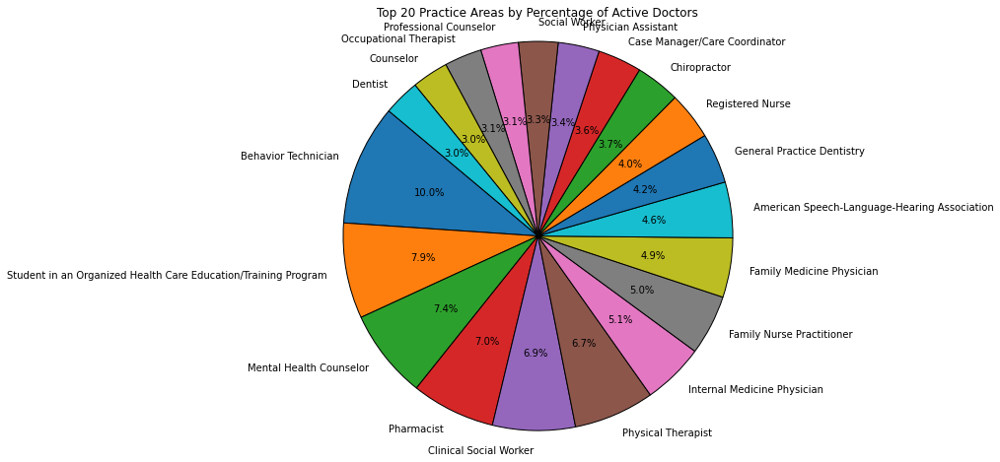

In [0]:
import pandas as pd
import matplotlib.pyplot as plt

# Converting the Spark to Pandas for visualization
grouped_active_by_practice_pandas = grouped_active_by_practice_sorted.toPandas()

# Dropping null values for visualization
grouped_active_by_practice_pandas_non_null = grouped_active_by_practice_pandas.dropna(subset=['Practice Name'])

# Sorting the data to get top 20 practice areas
top_20_active_practices = grouped_active_by_practice_pandas_non_null.sort_values(by='count', ascending=False).head(20)

# Creating a pie chart
plt.figure(figsize=(10, 8))
plt.pie(
    top_20_active_practices['count'], 
    labels=top_20_active_practices['Practice Name'], 
    autopct='%1.1f%%', 
    startangle=140,
    wedgeprops={'edgecolor': 'black'}
)
plt.title('Top 20 Practice Areas by Percentage of Active Doctors')
plt.axis('equal')  #circle
plt.show()

***EXTRA*** -
FIND DERMATOLOGIST - ASSUMING DOING PIE CHART TOP 9 WITH DERMATOLOGY TOTAL 10 OCCUPATION

Total active dermatologist count: 21078


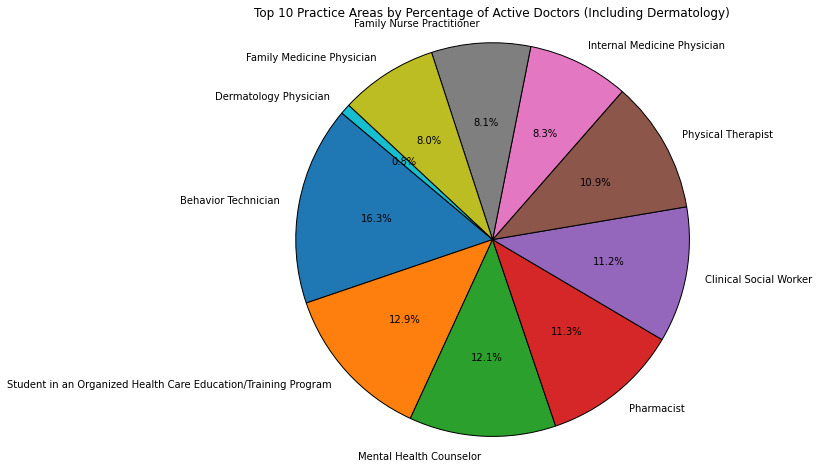

In [0]:
import pandas as pd
import matplotlib.pyplot as plt

# Filtering only the dermatology practice and converting 
dermatology_data = grouped_active_by_practice_sorted.filter(grouped_active_by_practice_sorted['Practice Name'] == 'Dermatology Physician').toPandas()

# Counts
total_active_dermatologists = dermatology_data['count'].sum()
print(f"Total active dermatologist count: {total_active_dermatologists}")

# Remove the dermatology data from the main data and convert the rest to Pandas
non_dermatology_data = grouped_active_by_practice_sorted.filter(grouped_active_by_practice_sorted['Practice Name'] != 'Dermatology Physician').toPandas()

# select top 9 practices
top_9_non_dermatology_practices = non_dermatology_data.sort_values(by='count', ascending=False).head(9)

# the dermatology data with the top 9  practices
if total_active_dermatologists > 0:
    dermatology_entry = pd.DataFrame([['Dermatology Physician', total_active_dermatologists]], columns=['Practice Name', 'count'])
    top_10_practices = pd.concat([top_9_non_dermatology_practices, dermatology_entry])
else:
    top_10_practices = top_9_non_dermatology_practices

# Create pie chart for top 10 practices including dermatology
plt.figure(figsize=(10, 8))
plt.pie(
    top_10_practices['count'],
    labels=top_10_practices['Practice Name'],
    autopct='%1.1f%%',
    startangle=140,
    wedgeprops={'edgecolor': 'black'}
)
plt.title('Top 10 Practice Areas by Percentage of Active Doctors (Including Dermatology)')
plt.axis('equal')
plt.show()

TASK 5- CHECK DOCTORS

In [0]:
import pandas as pd
import re

# helper function: normalize strings by trimming, converting to lowercase, and removing punctuation
def normalize_string(value):
    return re.sub(r'[^\w\s]', '', value.strip().lower()) if pd.notna(value) else value

# normalize an entire dataframe
def normalize_dataframe(df):
    return df.applymap(normalize_string)

# list of doctors to check
doctors_to_check = [
    {"first_name": "Elizabeth", "last_name": "Botham", "credential": "MD", "address": "1 Seymour St 6th Floor, Montclair, NJ 07042", "phone": None},
    {"first_name": "Michael", "last_name": "Costanzo", "credential": "APN", "address": "890 Mountain Ave 3rd Floor, New Providence, NJ 07974", "phone": None},
    {"first_name": "Jenna", "last_name": "Presto", "credential": "MD", "address": "6 Brighton Rd, Clifton, NJ 07012", "phone": None},
    {"first_name": "Daniel", "last_name": "Roling", "credential": "MD", "address": "6 Lancaster Ave, Wynnewood, PA 19096", "phone": None},
    {"first_name": "Marlyn", "last_name": "Wu", "credential": "DO", "address": "2 Brighton Road, 2nd Floor, Clifton, NJ", "phone": "(973) 792-8455"},
    {"first_name": "Robert", "last_name": "Kantor", "credential": "MD", "address": "1255 Broad St., 2nd Floor, Clifton, NJ", "phone": "(973) 685-5736"}
]

# normalize the list of doctors
doctors_to_check_df = normalize_dataframe(pd.DataFrame(doctors_to_check))

# example active doctor dataset
data = [
    {"Provider First Name": "elizabeth", "Provider Last Name (Legal Name)": "botham", "Provider Credential Text": "MD",
     "Provider First Line Business Practice Location Address": "1 seymour st 6th floor", "Provider Business Practice Location Address City Name": "montclair",
     "Provider Business Practice Location Address State Name": "nj", "Provider Business Practice Location Address Postal Code": "07042",
     "Provider Business Practice Location Address Telephone Number": None},
    {"Provider First Name": "robert", "Provider Last Name (Legal Name)": "kantor", "Provider Credential Text": "MD",
     "Provider First Line Business Practice Location Address": "1255 broad st", "Provider Business Practice Location Address City Name": "clifton",
     "Provider Business Practice Location Address State Name": "nj", "Provider Business Practice Location Address Postal Code": "07013",
     "Provider Business Practice Location Address Telephone Number": "(973) 685-5736"},
    {"Provider First Name": "marlyn", "Provider Last Name (Legal Name)": "wu", "Provider Credential Text": "md",
     "Provider First Line Business Practice Location Address": "2 brighton road", "Provider Business Practice Location Address City Name": "clifton",
     "Provider Business Practice Location Address State Name": "nj", "Provider Business Practice Location Address Postal Code": None,
     "Provider Business Practice Location Address Telephone Number": "(973) 792-8455"}
]
# normalize the active doctors dataset
final_active_data_pandas = normalize_dataframe(pd.DataFrame(data))

# iterate over each doctor and generate result messages
for _, doctor in doctors_to_check_df.iterrows():
    # filter matches by first name and last name
    match_found = final_active_data_pandas[
        (final_active_data_pandas["Provider First Name"] == doctor["first_name"]) &
        (final_active_data_pandas["Provider Last Name (Legal Name)"] == doctor["last_name"])
    ]

    if not match_found.empty:
        # check credential match, considering different formats
        credential_match = match_found['Provider Credential Text'].isin(
            [doctor["credential"], doctor["credential"].replace(".", ""), doctor["credential"].replace(" ", "")]
        ).any()

        # collect all addresses and phone numbers
        all_addresses = match_found[[
            "Provider First Line Business Practice Location Address",
            "Provider Business Practice Location Address City Name",
            "Provider Business Practice Location Address State Name",
            "Provider Business Practice Location Address Postal Code"
        ]].dropna(how='all').values.tolist()

        all_phones = match_found["Provider Business Practice Location Address Telephone Number"].dropna().tolist()

        # check address and phone matches
        address_match = any(doctor["address"] in str(item) for sublist in all_addresses for item in sublist)
        phone_match = doctor["phone"] and any(doctor["phone"] in phone for phone in all_phones)

        # generate message based on match results
        result_message = f"{doctor['first_name'].title()} {doctor['last_name'].title()} is presented in the list"

        if credential_match and (address_match or phone_match):
            result_message += ", credential matches and address or phone matches."
        elif credential_match:
            result_message += ", credential matches but address and phone do NOT match."
        elif address_match or phone_match:
            result_message += ", address or phone matches but credential does NOT match."
        else:
            result_message += ", but no match on credentials or address/phone."

        # print result message
        print(result_message)

        # display alternative addresses and credentials if full match is not found
        if not (credential_match and (address_match or phone_match)):
            if not credential_match:
                result_message += "\n  Credential options found:"
                for cred in match_found['Provider Credential Text'].unique():
                    print(f"    - {cred}")

            if not address_match or not phone_match:
                if all_addresses:
                    print("  Address options are:")
                    for addr in all_addresses:
                        print(f"    - {' '.join(filter(None, addr))}")
                if all_phones:
                    print("  Phone options are:")
                    for p in all_phones:
                        print(f"    - {p}")

    else:
        # if no match found for the name
        print(f"{doctor['first_name'].title()} {doctor['last_name'].title()}, {doctor['credential']}, is NOT presented in the list.")


Elizabeth Botham is presented in the list, credential matches but address and phone do NOT match.
  Address options are:
    - 1 seymour st 6th floor montclair nj 07042
Michael Costanzo, apn, is NOT presented in the list.
Jenna Presto, md, is NOT presented in the list.
Daniel Roling, md, is NOT presented in the list.
Marlyn Wu is presented in the list, address or phone matches but credential does NOT match.
    - md
  Address options are:
    - 2 brighton road clifton nj
  Phone options are:
    - 973 7928455
Robert Kantor is presented in the list, credential matches and address or phone matches.
